PyDrive activation Used for bypassing Google Drive download rate limit

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
!nvidia-smi

Thu Jul  7 12:09:48 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.57.02    Driver Version: 470.57.02    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  On   | 00000000:C7:00.0 Off |                    0 |
| N/A   38C    P0    60W / 400W |      0MiB / 81251MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
import os
import sys
if os.path.exists('inference_playground.ipynb'):
    os.chdir('..')
sys.path.insert(0,os.getcwd()) #Add PTI

In [4]:
!pwd

/ibex/ai/home/cvejica/PTI


In [5]:
from PIL import Image
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
#from google.colab import auth
from oauth2client.client import GoogleCredentials

download_with_pydrive = False #@param {type:"boolean"}  

class Downloader(object):
    def __init__(self, use_pydrive):
        self.use_pydrive = use_pydrive

        if self.use_pydrive:
            self.authenticate()
        
    def authenticate(self):
        auth.authenticate_user()
        gauth = GoogleAuth()
        gauth.credentials = GoogleCredentials.get_application_default()
        self.drive = GoogleDrive(gauth)
    
    def download_file(self, file_id, file_dst):
        if self.use_pydrive:
            downloaded = self.drive.CreateFile({'id':file_id})
            downloaded.FetchMetadata(fetch_all=True)
            downloaded.GetContentFile(file_dst)
        else:
            if os.path.exists(file_dst):
                print("Dataset already exists")
            else:
                !gdown --id $file_id -O $file_dst

downloader = Downloader(download_with_pydrive)

## Step 1 - Install Packages required by PTI

In [6]:
# ## Other packages are already builtin in the Colab interpreter
# !pip install wandb
# !pip install lpips

# ## Used for faster inference of StyleGAN by enabling C++ code compilation

# !wget https://github.com/ninja-build/ninja/releases/download/v1.8.2/ninja-linux.zip
# !sudo unzip ninja-linux.zip -d /usr/local/bin/
# !sudo update-alternatives --install /usr/bin/ninja ninja /usr/local/bin/ninja 1 --force

## Step 2 - Download Pretrained models

In [7]:
import os
import sys
import pickle
import numpy as np


from PIL import Image
import torch



from configs import paths_config, hyperparameters, global_config
from utils.align_data import pre_process_images
from scripts.run_pti import run_PTI
from IPython.display import display
import matplotlib.pyplot as plt
from scripts.latent_editor_wrapper import LatentEditorWrapper

In [8]:
current_directory = os.getcwd()
save_path = os.path.join(current_directory, "pretrained_models")
#save_path = os.path.join(os.path.dirname(current_directory), CODE_DIR, "pretrained_models")
os.makedirs(save_path, exist_ok=True)

In [9]:
# Download pretrained StyleGAN on FFHQ 1024x1024
downloader.download_file("125OG7SMkXI-Kf2aqiwLLHyCvSW-gZk3M", os.path.join(save_path, 'ffhq.pkl'))

Dataset already exists


In [10]:
## Download Dlib tool for alingment, used for preprocessing images before PTI
downloader.download_file("1xPmn19T6Bdd-_RfCVlgNBbfYoh1muYxR", os.path.join(save_path, 'align.dat'))

Dataset already exists


In [11]:
## Download E4E tool for alingment, used for preprocessing images before PTI
downloader.download_file("1ALC5CLA89Ouw40TwvxcwebhzWXM5YSCm", os.path.join(save_path, 'e4e_ffhq_encode.pt'))


Dataset already exists


## Step 3 - Configuration Setup

In [12]:
image_dir_name = 'image'

## If set to true download desired image from given url. If set to False, assumes you have uploaded personal image to
## 'image_original' dir
use_image_online = True
hyperparameters.use_locality_regularization = False
image_name = 'personal_image'
use_multi_id_training = False
global_config.device = 'cuda'

paths_config.input_data_id = image_dir_name


paths_config.e4e = './pretrained_models/e4e_ffhq_encode.pt'
paths_config.input_data_path = f'./{image_dir_name}_processed'
paths_config.stylegan2_ada_ffhq = './pretrained_models/ffhq.pkl'
paths_config.checkpoints_dir = '.'
paths_config.style_clip_pretrained_mappers = './pretrained_models'
paths_config.dlib = os.path.join(os.getcwd(), "pretrained_models/align.dat")
paths_config.input_data_path = os.path.join(os.getcwd(), "image_processed")


os.makedirs(f'./{image_dir_name}_original', exist_ok=True)
os.makedirs(f'./{image_dir_name}_processed', exist_ok=True)

## Step 4 - Preproccess Data

In [13]:
#os.chdir(f'./{image_dir_name}_original')
## Download real face image
## If you want to use your own image skip this part and upload an image/images of your choosing to image_original dir
# if use_image_online:
#     if os.path.exists(os.path.join(f'./{image_dir_name}_original/personal_image.jpg')):
#         print('Already exists')
#     else:
#         !wget -O ./image_original/personal_image.jpg https://static01.nyt.com/images/2019/09/09/opinion/09Hunter1/09Hunter1-superJumbo.jpg ## Photo of Sarena Wiliams

In [14]:
# Obama
#!wget -O ./image_original/personal_image.jpg https://upload.wikimedia.org/wikipedia/commons/e/e9/Official_portrait_of_Barack_Obama.jpg

In [15]:
image_name = "obama"
print(os.getcwd())

/ibex/ai/home/cvejica/PTI


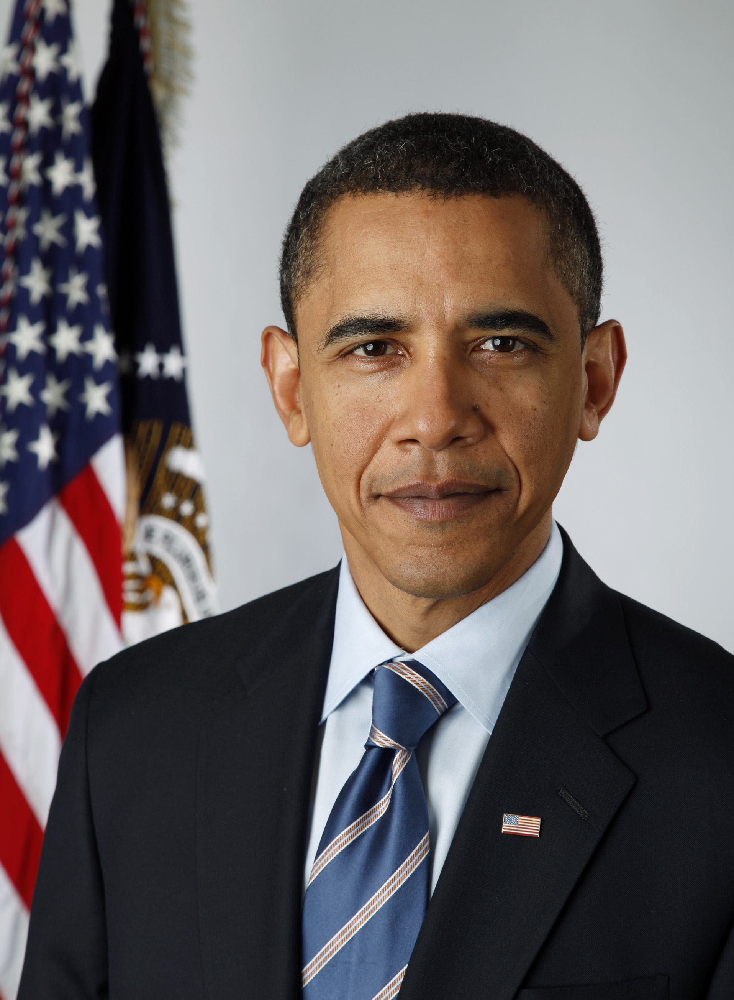

In [16]:
original_image = Image.open(f'./{image_dir_name}_original/{image_name}.jpg')
original_image

In [36]:
pre_process_images(os.path.join(os.getcwd(), f'{image_dir_name}_original'), 2048) 
# commented out so it doesn't process it all the time

100%|██████████| 17/17 [09:32<00:00, 33.66s/it]


Opening ./image_processed/obama.jpeg


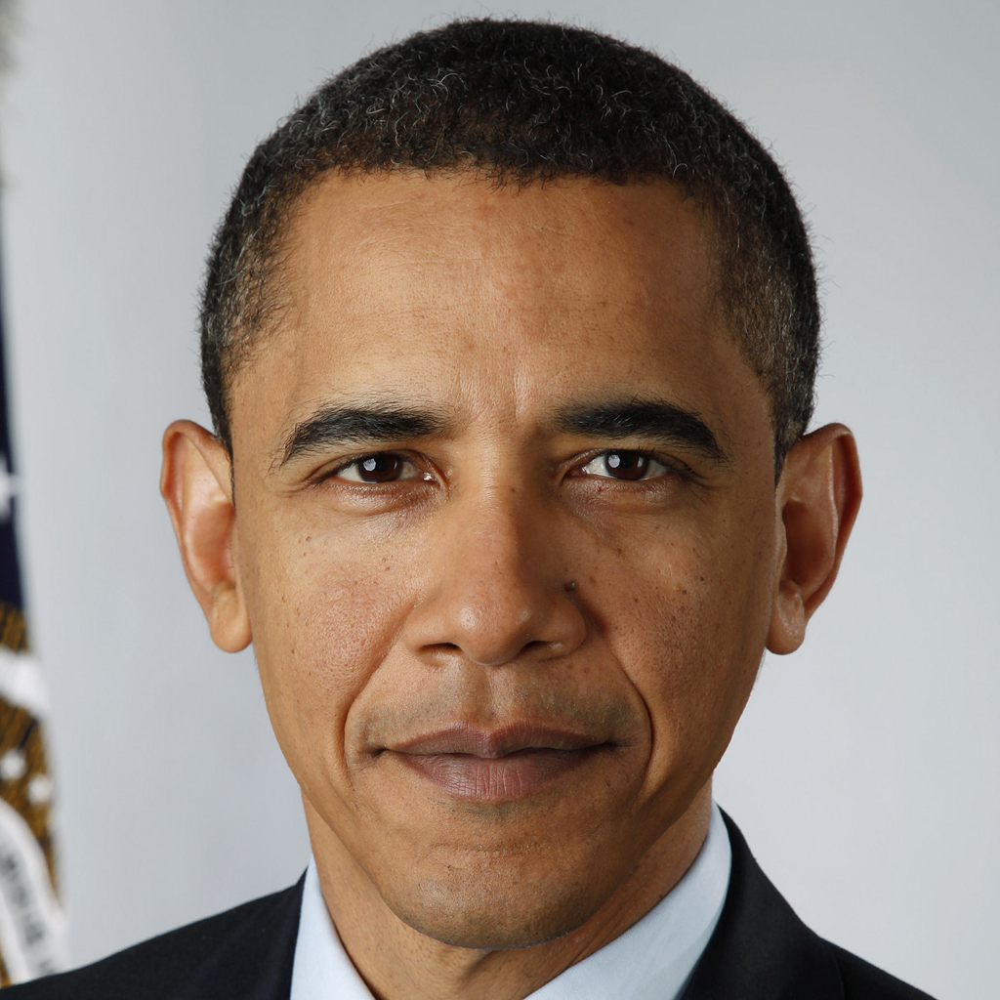

In [21]:
print(f'Opening ./{image_dir_name}_processed/{image_name}.jpeg')
aligned_image = Image.open(f'./{image_dir_name}_processed/{image_name}.png')
aligned_image
#aligned_image.resize((512,512))

In [17]:
import torch
q = torch.randn((1,3,1024,1024), device='cuda')
q2 = q.cpu().detach().squeeze(0).numpy().transpose(1,2,0)

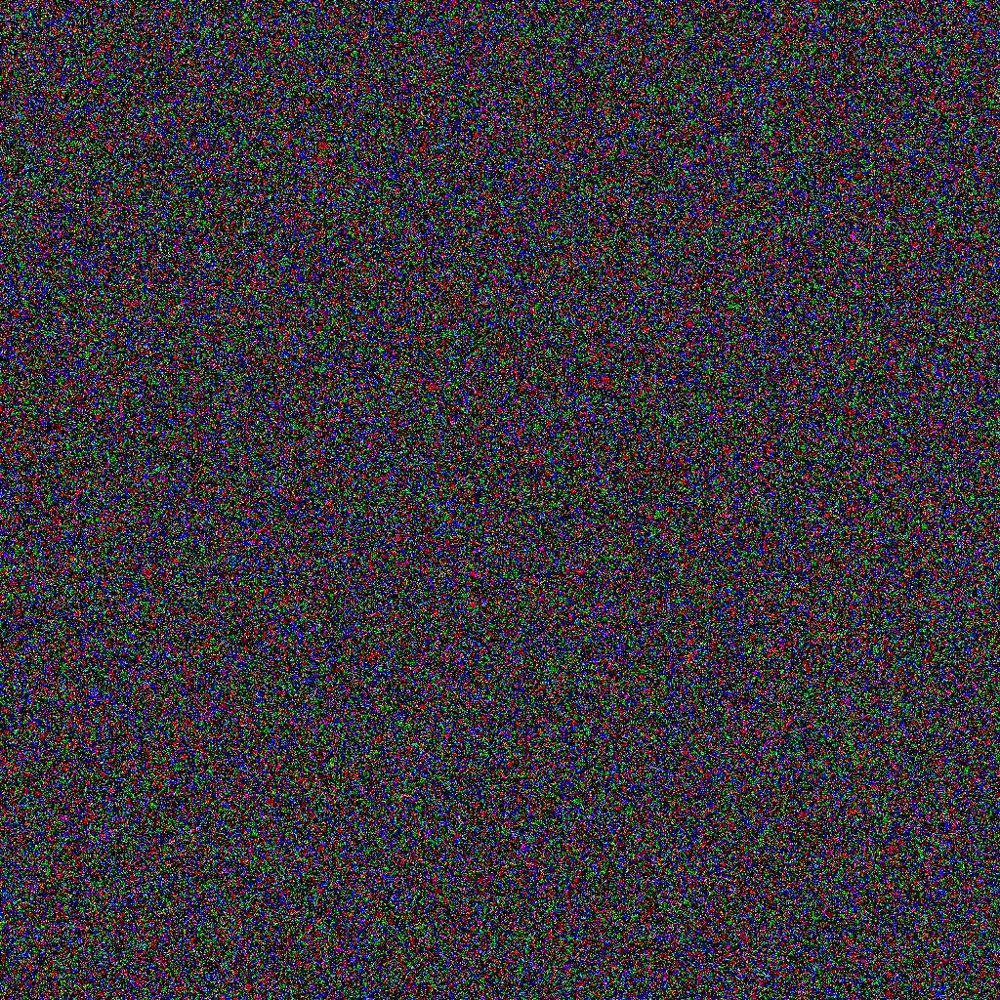

In [20]:
Image.fromarray(q2.astype('uint8'), 'RGB')

## Step 5 - Invert images using PTI

In order to run PTI and use StyleGAN2-ada, the cwd should the parent of 'torch_utils' and 'dnnlib'.

In case use_multi_id_training is set to True and many images are inverted simultaneously
activating the regularization to keep the *W* Space intact is recommended.

If indeed the regularization is activated then please increase the number of pti steps from 350 to 450 at least
using hyperparameters.max_pti_steps

In [17]:
from random import choice
from string import ascii_uppercase
from torch.utils.data import DataLoader
from torchvision.transforms import transforms
import os
from configs import global_config, paths_config
import wandb

from training.coaches.multi_id_coach import MultiIDCoach
from training.coaches.single_id_coach import SingleIDCoach
from utils.ImagesDataset import ImagesDataset

from utils.log_utils import print_config

import os
os.environ['WANDB_NOTEBOOK_NAME'] = './notebooks/inference_playground.ipynb'


def local_run_PTI(run_name='test', use_wandb=True, use_multi_id_training=False, dataloader = None):
    os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
    os.environ['CUDA_VISIBLE_DEVICES'] = global_config.cuda_visible_devices

    if run_name == '':
        global_config.run_name = ''.join(choice(ascii_uppercase) for i in range(12))
    else:
        global_config.run_name = run_name

    if use_wandb:
        global_config.run = wandb.init(project=paths_config.pti_results_keyword, reinit=True, name=global_config.run_name)
    global_config.pivotal_training_steps = 1
    global_config.training_step = 1
    
    
    wandb.config.update(print_config(hyperparameters)) # Added for more info in wandb
    wandb.config.update(print_config(global_config))
    
    embedding_dir_path = f'{paths_config.embedding_base_dir}/{paths_config.input_data_id}/{paths_config.pti_results_keyword}'
    os.makedirs(embedding_dir_path, exist_ok=True)
    if dataloader is None:
        dataset = ImagesDataset(paths_config.input_data_path, transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])]))

        dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

    if use_multi_id_training:
        coach = MultiIDCoach(dataloader, use_wandb)
    else:
        coach = SingleIDCoach(dataloader, use_wandb)
    
    coach.train()

    return global_config.run_name

In [18]:
os.environ["WANDB_MODE"] = "online"

global_config.downsample_lpips = False # Test global
global_config.antialias = False # Test global
global_config.init_reinit_generator = False # False
global_config.init_reset_generator = False
global_config.zero_out_generator = False

global_config.use_edits_on_run = False # visualization

# Use previosly calculated initial w 
# hyperparameters.use_last_w_pivots
hyperparameters.use_last_w_pivots = False # speedup

global_config.init_method = "xavier_uniform_" #"xavier_uniform_" # default xavier_uniform_
global_config.init_bias_method = "constant_"
global_config.init_layers = [] #['b1024'] # default ['fc6', 'fc7']
global_config.training_step = 1
global_config.lanczos = False
global_config.init_reset_generator = False
global_config.zero_out_generator = False
global_config.init_reinit_generator = False
global_config.freeze_layers = [] #['b4', 'b8', 'b16', 'b32', 'b64', 'b128', 'b256', 'b512', 'b1024'] #['b4', 'b8', 'b16', 'b32', 'b64', 'b128', 'b256', 'b512', 'b1024'] #['']
global_config.add_extra_layer = True

global_config.run_name = run_name = model_id = 'bse_png_2k_loss'
global_config.notes = "extra 2k layer added, new loss added"
use_wandb = True
use_multi_id_training = False # FOR NOW FALSE, it was the reason for artifacts

print_config(global_config, True)
print(f'Use_wandb:{use_wandb}\nUse_mutli_id_training:{use_multi_id_training}')

__name__:configs.global_config
__package__:configs
__file__:/ibex/ai/home/cvejica/PTI/configs/global_config.py
__cached__:/ibex/ai/home/cvejica/PTI/configs/__pycache__/global_config.cpython-37.pyc
cuda_visible_devices:0
device:cuda
training_step:1
image_rec_result_log_snapshot:100
pivotal_training_steps:0
model_snapshot_interval:400
run_name:bse_png_2k_loss
downsample_lpips:False
antialias:False
lanczos:False
init_reset_generator:False
init_reinit_generator:False
init_method:xavier_uniform_
init_bias_method:constant_
init_layers:[]
freeze_layers:[]
use_edits_on_run:False
img_index:0
zero_out_generator:False
add_extra_layer:True
plot_grad:False
notes:extra 2k layer added, new loss added
Use_wandb:True
Use_mutli_id_training:False


In [19]:
print_config(global_config)

{'__name__': 'configs.global_config',
 '__package__': 'configs',
 '__file__': '/ibex/ai/home/cvejica/PTI/configs/global_config.py',
 '__cached__': '/ibex/ai/home/cvejica/PTI/configs/__pycache__/global_config.cpython-37.pyc',
 'cuda_visible_devices': '0',
 'device': 'cuda',
 'training_step': 1,
 'image_rec_result_log_snapshot': 100,
 'pivotal_training_steps': 0,
 'model_snapshot_interval': 400,
 'run_name': 'bse_png_2k_loss',
 'downsample_lpips': False,
 'antialias': False,
 'lanczos': False,
 'init_reset_generator': False,
 'init_reinit_generator': False,
 'init_method': 'xavier_uniform_',
 'init_bias_method': 'constant_',
 'init_layers': [],
 'freeze_layers': [],
 'use_edits_on_run': False,
 'img_index': 0,
 'zero_out_generator': False,
 'add_extra_layer': True,
 'plot_grad': False,
 'notes': 'extra 2k layer added, new loss added'}

In [20]:
hyperparameters.max_pti_steps = 401
hyperparameters.first_inv_type = 'w'
hyperparameters.pt_lpips_lambda = 1
#hyperparameters.train_batch_size = 1
hyperparameters.use_locality_regularization = False # locality? 
hyperparameters.pti_learning_rate = 0.0003 #0.006
hyperparameters.pt_MS_GMSD_lambda = 1
print_config(hyperparameters)

{'__name__': 'configs.hyperparameters',
 '__package__': 'configs',
 '__file__': '/ibex/ai/home/cvejica/PTI/configs/hyperparameters.py',
 '__cached__': '/ibex/ai/home/cvejica/PTI/configs/__pycache__/hyperparameters.cpython-37.pyc',
 'lpips_type': 'alex',
 'first_inv_type': 'w',
 'optim_type': 'adam',
 'latent_ball_num_of_samples': 1,
 'locality_regularization_interval': 1,
 'use_locality_regularization': False,
 'regulizer_l2_lambda': 0.1,
 'regulizer_lpips_lambda': 0.1,
 'regulizer_alpha': 30,
 'pt_l2_lambda': 1,
 'pt_lpips_lambda': 1,
 'pt_MS_GMSD_lambda': 1,
 'LPIPS_value_threshold': 0.06,
 'max_pti_steps': 401,
 'first_inv_steps': 450,
 'max_images_to_invert': 30,
 'pti_learning_rate': 0.0003,
 'first_inv_lr': 0.005,
 'train_batch_size': 1,
 'use_last_w_pivots': False}

In [37]:
import wandb
local_run_PTI(run_name, use_wandb, use_multi_id_training)
wandb.finish()

LPIPS_loss_val_00862,▁
MSE_loss_val_00862,▁
PSNR_val_00862,▁
batch,▃▅▆█▁
first projection _00862,█▁▁▁▁
lstep,▁▁▁▁▁
LPIPS_loss_val_00862,0.54124
MSE_loss_val_00862,0.13032
PSNR_val_00862,14.99598
batch,1
first projection _00862,0.37317


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /home/cvejica/.conda/envs/ae/lib/python3.7/site-packages/lpips/weights/v0.1/alex.pth
Wandb is being used to visualize gradient


  0%|          | 0/17 [00:00<?, ?it/s]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.34it/s]



  6%|▌         | 1/17 [01:14<19:58, 74.89s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.30it/s]



 12%|█▏        | 2/17 [02:30<18:46, 75.11s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.38it/s]



 18%|█▊        | 3/17 [03:44<17:26, 74.73s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.28it/s]



 24%|██▎       | 4/17 [05:00<16:16, 75.09s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.33it/s]



 29%|██▉       | 5/17 [06:14<14:57, 74.77s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.38it/s]



 35%|███▌      | 6/17 [07:28<13:40, 74.60s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.42it/s]



 41%|████      | 7/17 [08:42<12:24, 74.48s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.32it/s]



 47%|████▋     | 8/17 [09:57<11:10, 74.49s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.43it/s]



 53%|█████▎    | 9/17 [11:09<09:49, 73.67s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.35it/s]



 59%|█████▉    | 10/17 [12:21<08:33, 73.34s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.36it/s]



 65%|██████▍   | 11/17 [13:35<07:21, 73.56s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.37it/s]



 71%|███████   | 12/17 [14:51<06:10, 74.17s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.35it/s]



 76%|███████▋  | 13/17 [16:06<04:58, 74.57s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.40it/s]



 82%|████████▏ | 14/17 [17:22<03:44, 74.76s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.33it/s]



 88%|████████▊ | 15/17 [18:35<02:28, 74.30s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.29it/s]



 94%|█████████▍| 16/17 [19:52<01:15, 75.12s/it]

torch.Size([3, 1024, 1024]) == (3, 1024, 1024)



100%|██████████| 450/450 [00:29<00:00, 15.32it/s]



100%|██████████| 17/17 [21:08<00:00, 74.63s/it]


GMSD_loss_val_00862,█▇▆▆▅▅▅▅▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁
GMSD_loss_val_00882,█▇▆▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁
GMSD_loss_val_00975,█▆▅▅▅▅▄▄▄▄▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
GMSD_loss_val_art1,█▆▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
GMSD_loss_val_art2,█▆▅▅▅▄▄▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
GMSD_loss_val_art3,█▆▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁
GMSD_loss_val_david,█▇▆▅▅▄▄▄▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
GMSD_loss_val_harley,█▇▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
GMSD_loss_val_iron_man,█▆▅▅▅▅▄▄▄▄▄▃▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
GMSD_loss_val_joker,█▇▆▆▆▅▅▅▄▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁
GMSD_loss_val_obama,█▇▆▆▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁


In [34]:
!nvidia-smi

Wed Jul  6 20:07:33 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.57.02    Driver Version: 470.57.02    CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  On   | 00000000:C7:00.0 Off |                    0 |
| N/A   39C    P0    72W / 400W |   9958MiB / 81251MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [76]:
#from scripts.run_pti import run_PTI

In [77]:
#run_PTI(run_name, use_wandb, use_multi_id_training)

#### Experimental 

In [26]:
def load_all(model_id, image_name):
  with open(paths_config.stylegan2_ada_ffhq, 'rb') as f:
    old_G = pickle.load(f)

  return old_G
generator_type = paths_config.multi_id_model_type if use_multi_id_training else image_name
old_G = load_all("bse", generator_type)['G_ema'].cuda()

In [269]:
old_G.synthesis.b1024.init_kwargs

{'w_dim': 512,
 'resolution': 1024,
 'img_channels': 3,
 'is_last': True,
 'use_fp16': True,
 'conv_clamp': 256,
 'architecture': 'skip',
 'resample_filter': [1, 3, 3, 1],
 'use_noise': True,
 'activation': 'lrelu'}

In [29]:
from utils.models_utils import expand_model

In [30]:
expand_model(old_G)

False

In [31]:
old_G

Generator(
  (synthesis): SynthesisNetwork(
    (b4): SynthesisBlock(
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b8): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b16): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b32): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConn

In [45]:
old_G.img_resolution

1024

In [270]:
old_G.synthesis.b1024.__init__

<bound method persistent_class.<locals>.Decorator.__init__ of SynthesisBlock(
  (conv0): SynthesisLayer(
    (affine): FullyConnectedLayer()
  )
  (conv1): SynthesisLayer(
    (affine): FullyConnectedLayer()
  )
  (torgb): ToRGBLayer(
    (affine): FullyConnectedLayer()
  )
)>

In [98]:
dir(old_G.synthesis)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_init_args',
 '_init_kwargs',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_set',
 '_orig_class_name',
 '_orig_module_src',
 '_parameters',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dict',
 '_s

In [183]:
old_G.synthesis.b1024.__class__.__name__

'SynthesisBlock'

In [271]:
old_G.synthesis.b1024.init_args

(64, 32)

In [343]:
info = {'w_dim': 512,
 'resolution': 2048,
 'img_channels': 3,
 'is_last': False,
 'use_fp16': True,
 'conv_clamp': 256,
 'architecture': 'skip',
 'resample_filter': [1, 3, 3, 1],
 'use_noise': True,
 'activation': 'lrelu',
}
# info.update({
#     'in_channels': 
#     "out_channels":
# })
# kwargs = vars(info)
args = (32, 16)
cls = old_G.synthesis.b1024.__class__
b2048 = cls(*args, **info).cuda()

In [344]:
old_G

Generator(
  (synthesis): SynthesisNetwork(
    (b4): SynthesisBlock(
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b8): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b16): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b32): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConn

In [175]:
old_G.synthesis.__class__

torch_utils.persistence.persistent_class.<locals>.Decorator

In [345]:
#old_G.synthesis.add_module('b2048', b2048.cuda())

old_G.synthesis.num_ws += b2048.num_conv
# if is_last:
#     self.num_ws += b2048.num_torgb
setattr(old_G.synthesis, f'b2048', b2048)
old_G.synthesis.block_resolutions.append(2048)

In [346]:
old_G.synthesis.num_ws

20

In [331]:
from utils.models_utils import initialize_weights

In [332]:
#global_config.
initialize_weights(old_G.synthesis)

 skipped reinitialization with ['b2048']
b4 skipped reinitialization with ['b2048']
b4.conv1 skipped reinitialization with ['b2048']
b4.conv1.affine skipped reinitialization with ['b2048']
b4.torgb skipped reinitialization with ['b2048']
b4.torgb.affine skipped reinitialization with ['b2048']
b8 skipped reinitialization with ['b2048']
b8.conv0 skipped reinitialization with ['b2048']
b8.conv0.affine skipped reinitialization with ['b2048']
b8.conv1 skipped reinitialization with ['b2048']
b8.conv1.affine skipped reinitialization with ['b2048']
b8.torgb skipped reinitialization with ['b2048']
b8.torgb.affine skipped reinitialization with ['b2048']
b16 skipped reinitialization with ['b2048']
b16.conv0 skipped reinitialization with ['b2048']
b16.conv0.affine skipped reinitialization with ['b2048']
b16.conv1 skipped reinitialization with ['b2048']
b16.conv1.affine skipped reinitialization with ['b2048']
b16.torgb skipped reinitialization with ['b2048']
b16.torgb.affine skipped reinitializatio

In [310]:
for l in global_config.init_layers:
    print(l)

b2048


In [347]:
print_config(global_config)

{'__name__': 'configs.global_config',
 '__package__': 'configs',
 '__file__': '/ibex/ai/home/cvejica/PTI/configs/global_config.py',
 '__cached__': '/ibex/ai/home/cvejica/PTI/configs/__pycache__/global_config.cpython-37.pyc',
 'cuda_visible_devices': '0',
 'device': 'cuda:0',
 'training_step': 1,
 'image_rec_result_log_snapshot': 100,
 'pivotal_training_steps': 0,
 'model_snapshot_interval': 400,
 'run_name': '',
 'downsample_lpips': False,
 'antialias': False,
 'lanczos': True,
 'init_reset_generator': False,
 'init_reinit_generator': False,
 'init_method': 'xavier_uniform_',
 'init_bias_method': 'constant_',
 'init_layers': ['b2048'],
 'freeze_layers': [],
 'use_edits_on_run': False,
 'img_index': 0,
 'zero_out_generator': False}

In [ ]:
old_G.synthesis.b2048.toarg

In [136]:
old_G.synthesis.b2048.num_torgb

1

In [140]:
torch.cat?

In [206]:
w2_pivot[:,-4:,:]

tensor([[[ 0.8086,  0.0211,  0.1545,  ...,  0.0923, -0.2373,  0.0139],
         [ 0.8086,  0.0211,  0.1545,  ...,  0.0923, -0.2373,  0.0139],
         [ 0.8086,  0.0211,  0.1545,  ...,  0.0923, -0.2373,  0.0139],
         [ 0.8086,  0.0211,  0.1545,  ...,  0.0923, -0.2373,  0.0139]]],
       device='cuda:0')

In [222]:
old_G.synthesis.b2048.architecture

'skip'

In [348]:
#embedding_dir
w_pivot = torch.load(f'{embedding_dir}/0.pt')

In [276]:
w_pivot[:, 1, :] - w_pivot[:, 7, :]

tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

In [235]:
w_pivot

tensor([[[ 0.7322,  0.1974,  0.0988,  ...,  0.0979, -0.2846, -0.0068],
         [ 0.7322,  0.1974,  0.0988,  ...,  0.0979, -0.2846, -0.0068],
         [ 0.7322,  0.1974,  0.0988,  ...,  0.0979, -0.2846, -0.0068],
         ...,
         [ 0.7322,  0.1974,  0.0988,  ...,  0.0979, -0.2846, -0.0068],
         [ 0.7322,  0.1974,  0.0988,  ...,  0.0979, -0.2846, -0.0068],
         [ 0.7322,  0.1974,  0.0988,  ...,  0.0979, -0.2846, -0.0068]]],
       device='cuda:0', requires_grad=True)

In [351]:
w2_pivot = w_pivot.clone().detach()
w2_pivot = torch.cat([w2_pivot, w2_pivot[:,1:3,:]], dim=1)


In [352]:
w2_pivot.shape

torch.Size([1, 20, 512])

In [353]:
all_rgb = []
all_rgb_1024 = []

In [354]:

def test_hook(module, input, output):
    all_rgb.append(output.clone().detach())
    return output
def test_hook2(module, input, output):
    all_rgb_1024.append(output.clone().detach())
    return output

In [355]:
q = old_G.synthesis.b2048.torgb.register_forward_hook(test_hook)
q2 = old_G.synthesis.b1024.torgb.register_forward_hook(test_hook2)

In [356]:
old_G.synthesis.block_resolutions

[4, 8, 16, 32, 64, 128, 256, 512, 1024, 2048]

In [357]:
old_G = old_G.cuda()

In [358]:
rez = old_G.synthesis(w2_pivot.cuda(), noise_mode='const', force_fp32 = True)

In [359]:
rez.shape

torch.Size([1, 3, 2048, 2048])

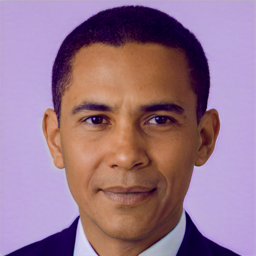

In [360]:
plot_syn_images([rez])

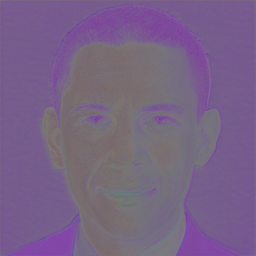

In [361]:
plot_syn_images(all_rgb)

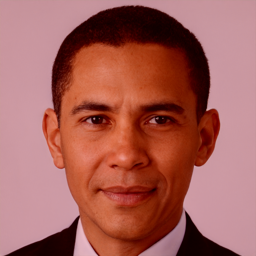

In [301]:
plot_syn_images([rez])

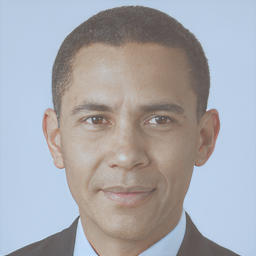

In [299]:
plot_syn_images(all_rgb_1024)

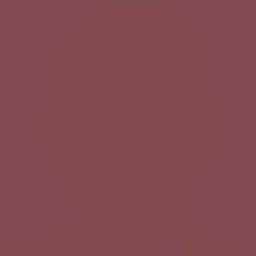

In [300]:
plot_syn_images(all_rgb)

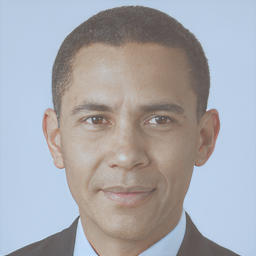

In [284]:
plot_syn_images(all_rgb_1024)

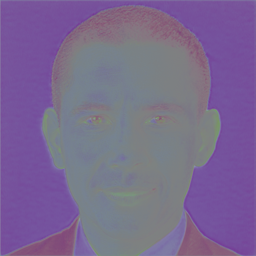

In [283]:
plot_syn_images(all_rgb)

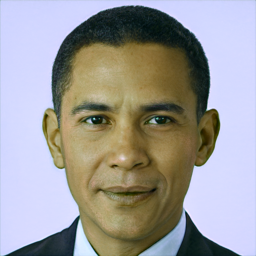

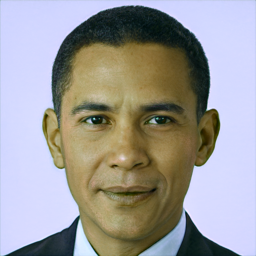

In [244]:
plot_syn_images([rez, rez])

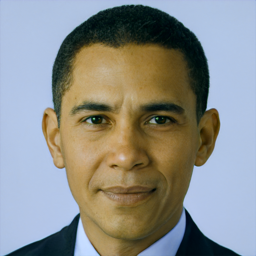

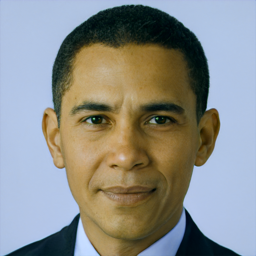

In [204]:
plot_syn_images([rez, rez])

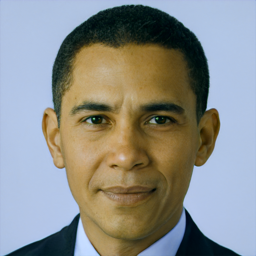

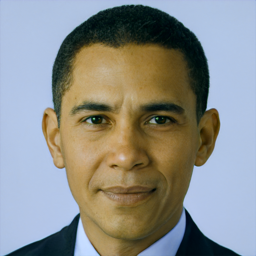

In [201]:
plot_syn_images([rez, rez])

In [197]:
rez_np = (rez.squeeze(0).permute(1,2,0)*127.5 + 128).detach().cpu().clamp(0,255).numpy().astype(np.uint8)

rez_pil = Image.fromarray(rez_np)
rez_pil.save('obama.png')


# plt.imshow((rez.squeeze(0).permute(1,2,0)*127.5 + 128).detach().cpu().clamp(0,255).numpy().astype(np.uint8))
# # (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).detach().cpu().numpy()[0] 
# plt.savefig("random.png")

In [166]:
old_G

Generator(
  (synthesis): SynthesisNetwork(
    (b4): SynthesisBlock(
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b8): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b16): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b32): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConn

In [118]:
getattr(old_G.synthesis, f'b2048')

SynthesisBlock(
  (conv0): SynthesisLayer(
    (affine): FullyConnectedLayer()
  )
  (conv1): SynthesisLayer(
    (affine): FullyConnectedLayer()
  )
  (torgb): ToRGBLayer(
    (affine): FullyConnectedLayer()
  )
)

In [165]:
rez.shape

torch.Size([1, 3, 2048, 2048])

In [65]:
test.forward?

In [60]:
old_G.synthesis.b1024.init_kwargs

{'w_dim': 512,
 'resolution': 2048,
 'img_channels': 3,
 'is_last': False,
 'use_fp16': False,
 'conv_clamp': 256,
 'architecture': 'skip',
 'resample_filter': [1, 3, 3, 1],
 'use_noise': True,
 'activation': 'lrelu'}

In [42]:
old_G.synthesis.b1024.init_kwargs

{'w_dim': 512,
 'resolution': 1024,
 'img_channels': 3,
 'is_last': True,
 'use_fp16': True,
 'conv_clamp': 256,
 'architecture': 'skip',
 'resample_filter': [1, 3, 3, 1],
 'use_noise': True,
 'activation': 'lrelu'}

In [41]:
old_G.synthesis.b512.init_args

(128, 64)

In [66]:
old_G.synthesis.b256.init_args

(256, 128)

In [67]:
old_G.synthesis.b128.init_args

(512, 256)

In [68]:
old_G.synthesis.b64.init_args

(512, 512)

In [81]:
old_G.synthesis.b64.init_kwargs

{'w_dim': 512,
 'resolution': 64,
 'img_channels': 3,
 'is_last': False,
 'use_fp16': False,
 'conv_clamp': 256,
 'architecture': 'skip',
 'resample_filter': [1, 3, 3, 1],
 'use_noise': True,
 'activation': 'lrelu'}

In [82]:
old_G.synthesis.b32.init_args

(512, 512)

In [83]:
old_G.synthesis.b32.init_kwargs

{'w_dim': 512,
 'resolution': 32,
 'img_channels': 3,
 'is_last': False,
 'use_fp16': False,
 'conv_clamp': 256,
 'architecture': 'skip',
 'resample_filter': [1, 3, 3, 1],
 'use_noise': True,
 'activation': 'lrelu'}

In [70]:
old_G.synthesis.b16.init_args

(512, 512)

In [56]:
old_G.synthesis.b512.in_channels

128

In [79]:
old_G.synthesis.b16.init_kwargs

{'w_dim': 512,
 'resolution': 16,
 'img_channels': 3,
 'is_last': False,
 'use_fp16': False,
 'conv_clamp': 256,
 'architecture': 'skip',
 'resample_filter': [1, 3, 3, 1],
 'use_noise': True,
 'activation': 'lrelu'}

In [71]:
old_G.synthesis.b8.init_args

(512, 512)

In [78]:
old_G.synthesis.b8.init_kwargs

{'w_dim': 512,
 'resolution': 8,
 'img_channels': 3,
 'is_last': False,
 'use_fp16': False,
 'conv_clamp': 256,
 'architecture': 'skip',
 'resample_filter': [1, 3, 3, 1],
 'use_noise': True,
 'activation': 'lrelu'}

In [72]:
old_G.synthesis.b4.init_args

(0, 512)

In [73]:
old_G.synthesis.b4.init_kwargs

{'w_dim': 512,
 'resolution': 4,
 'img_channels': 3,
 'is_last': False,
 'use_fp16': False,
 'conv_clamp': 256,
 'architecture': 'skip',
 'resample_filter': [1, 3, 3, 1],
 'use_noise': True,
 'activation': 'lrelu'}

In [23]:
test = load_all('bse', generator_type)

In [24]:
from torch_utils.misc import print_module_summary
from torch_utils.persistence import _module_to_src

In [172]:
print_module_summary(old_G.synthesis, [w2_pivot])


SynthesisNetwork    Parameters  Buffers   Output shape         Datatype
---                 ---         ---       ---                  ---     
b4.conv1.affine     262656      -         [1, 512]             float32 
b4.conv1            2359809     32        [1, 512, 4, 4]       float32 
b4.torgb.affine     262656      -         [1, 512]             float32 
b4.torgb            1539        -         [1, 3, 4, 4]         float32 
b4:0                8192        16        [1, 512, 4, 4]       float32 
b4:1                -           -         [1, 512, 4, 4]       float32 
b8.conv0.affine     262656      -         [1, 512]             float32 
b8.conv0            2359809     80        [1, 512, 8, 8]       float32 
b8.conv1.affine     262656      -         [1, 512]             float32 
b8.conv1            2359809     80        [1, 512, 8, 8]       float32 
b8.torgb.affine     262656      -         [1, 512]             float32 
b8.torgb            1539        -         [1, 3, 8, 8]         

tensor([[[[0.3005, 0.4279, 0.4103,  ..., 0.3947, 0.3593, 0.2686],
          [0.3589, 0.4802, 0.4848,  ..., 0.4658, 0.4487, 0.3310],
          [0.3943, 0.5188, 0.4940,  ..., 0.4638, 0.4536, 0.3343],
          ...,
          [0.3792, 0.5637, 0.5937,  ..., 0.4814, 0.4555, 0.3450],
          [0.2930, 0.4556, 0.5368,  ..., 0.5015, 0.4831, 0.3572],
          [0.1629, 0.2831, 0.3312,  ..., 0.3472, 0.3397, 0.2375]],

         [[0.2428, 0.4044, 0.4031,  ..., 0.3792, 0.3225, 0.2810],
          [0.3897, 0.5693, 0.5761,  ..., 0.5310, 0.4584, 0.3603],
          [0.4433, 0.6172, 0.5940,  ..., 0.5652, 0.5027, 0.4004],
          ...,
          [0.4845, 0.6953, 0.7304,  ..., 0.5646, 0.5272, 0.4326],
          [0.4503, 0.6440, 0.7346,  ..., 0.6199, 0.5610, 0.4350],
          [0.3159, 0.4655, 0.5547,  ..., 0.4922, 0.4683, 0.3530]],

         [[0.2528, 0.3664, 0.3873,  ..., 0.3453, 0.2939, 0.2365],
          [0.3673, 0.4927, 0.5045,  ..., 0.4431, 0.3797, 0.2884],
          [0.4133, 0.5371, 0.5240,  ..., 0

### Visualize results

In [26]:
image_name = 'obama'

In [27]:
model_id

'bse_ds_lpips_0.7'

In [152]:
plot_syn_images

<function __main__.plot_syn_images(syn_images)>

In [28]:
def display_alongside_source_image(images): 
    res = np.concatenate([np.array(image) for image in images], axis=1) 
    return Image.fromarray(res) 

In [29]:
def load_generators(model_id, image_name):
  with open(paths_config.stylegan2_ada_ffhq, 'rb') as f:
    old_G = pickle.load(f)['G_ema'].cuda()
    
  with open(f'{paths_config.checkpoints_dir}/model_{model_id}_{image_name}.pt', 'rb') as f_new: 
    new_G = torch.load(f_new).cuda()

  return old_G, new_G

In [30]:
generator_type = paths_config.multi_id_model_type if use_multi_id_training else image_name
old_G, new_G = load_generators("bse", generator_type) #model_id istead of hardcoded string

In [31]:
dir(old_G)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_init_args',
 '_init_kwargs',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_set',
 '_orig_class_name',
 '_orig_module_src',
 '_parameters',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dict',
 '_s

In [32]:
def plot_syn_images(syn_images): 
  for img in syn_images: 
      img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).detach().cpu().numpy()[0] 
      plt.axis('off') 
      resized_image = Image.fromarray(img,mode='RGB').resize((256,256)) 
      display(resized_image) 
      del img 
      del resized_image 
      torch.cuda.empty_cache()

In [223]:
w_path_dir = f'{paths_config.embedding_base_dir}/{paths_config.input_data_id}'
embedding_dir = f'{w_path_dir}/{paths_config.pti_results_keyword}/{image_name}'
w_pivot = torch.load(f'{embedding_dir}/0.pt')

In [225]:
wq1_pivot = torch.load(f'{embedding_dir}/0.pt')

tensor([[[ 0.8086,  0.0211,  0.1545,  ...,  0.0923, -0.2373,  0.0139],
         [ 0.8086,  0.0211,  0.1545,  ...,  0.0923, -0.2373,  0.0139],
         [ 0.8086,  0.0211,  0.1545,  ...,  0.0923, -0.2373,  0.0139],
         ...,
         [ 0.8086,  0.0211,  0.1545,  ...,  0.0923, -0.2373,  0.0139],
         [ 0.8086,  0.0211,  0.1545,  ...,  0.0923, -0.2373,  0.0139],
         [ 0.8086,  0.0211,  0.1545,  ...,  0.0923, -0.2373,  0.0139]]],
       device='cuda:0', requires_grad=True)

In [34]:
old_image = old_G.synthesis(w_pivot, noise_mode='const', force_fp32 = True)
new_image = new_G.synthesis(w_pivot, noise_mode='const', force_fp32 = True)

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


Upper image is the inversion before Pivotal Tuning and the lower image is the product of pivotal tuning


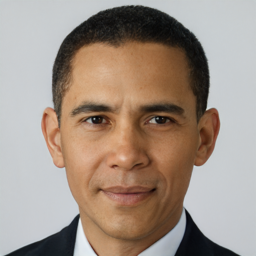

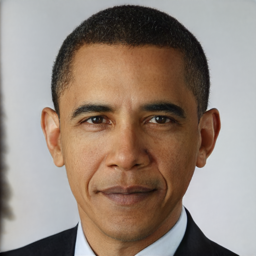

In [49]:
print('Upper image is the inversion before Pivotal Tuning and the lower image is the product of pivotal tuning')
plot_syn_images([old_image, new_image])

### InterfaceGAN edits

In [50]:
latent_editor = LatentEditorWrapper()
latents_after_edit = latent_editor.get_single_interface_gan_edits(w_pivot, [-2, 2])

In order to get different edits. Such as younger face or make the face smile more. Please change the factors passed to "get_single_interface_gan_edits". Currently the factors are [-2,2]. You can pass for example: range(-3,3)

In [44]:
q = [-2, 2]
type(q)

list

In [45]:
type(latents_after_edit)

dict

Showing rotation change


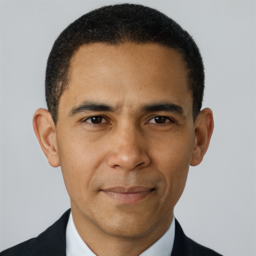

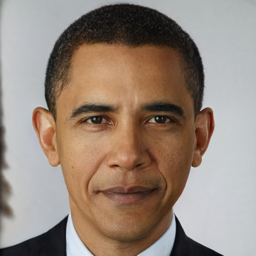

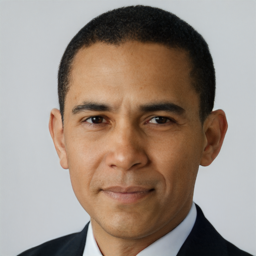

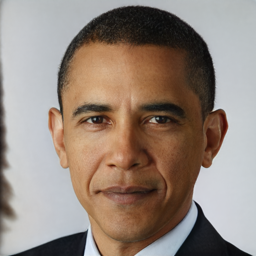

Showing smile change


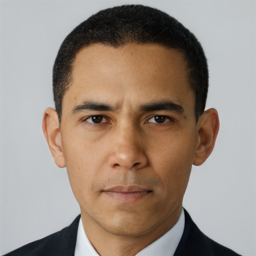

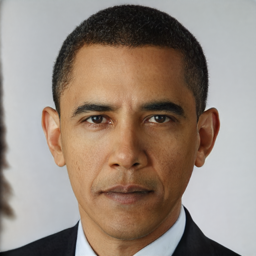

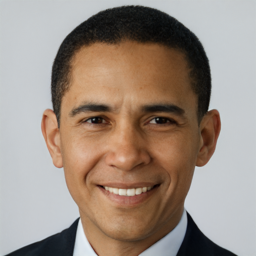

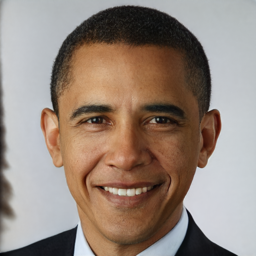

Showing age change


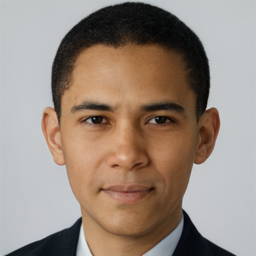

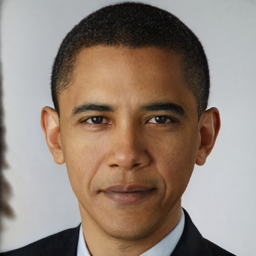

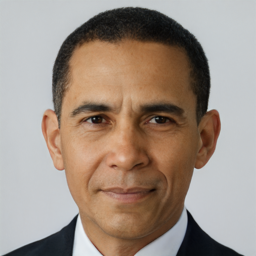

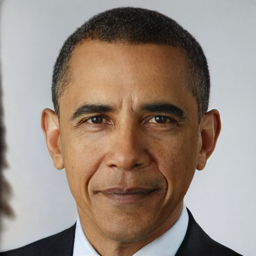

In [33]:
for direction, factor_and_edit in latents_after_edit.items():
  print(f'Showing {direction} change')
  for latent in factor_and_edit.values():
    old_image = old_G.synthesis(latent, noise_mode='const', force_fp32 = True)
    new_image = new_G.synthesis(latent, noise_mode='const', force_fp32 = True)
    plot_syn_images([old_image, new_image])

### StyleCLIP edditing

In [35]:
save_path

'/ibex/ai/home/cvejica/PTI/pretrained_models'

In [36]:
# More pretrained mappers can be found at: "https://github.com/orpatashnik/StyleCLIP/blob/main/utils.py"
# Download Afro mapper
downloader.download_file("1i5vAqo4z0I-Yon3FNft_YZOq7ClWayQJ", os.path.join(save_path, 'afro.pt'))

/home/cvejica/.conda/envs/ae/lib/python3.7/site-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1i5vAqo4z0I-Yon3FNft_YZOq7ClWayQJ
To: /ibex/ai/home/cvejica/PTI/pretrained_models/afro.pt
100%|████████████████████████████████████████| 141M/141M [00:02<00:00, 51.4MB/s]


In [38]:
# Download Mohawk mapper
downloader.download_file("1oMMPc8iQZ7dhyWavZ7VNWLwzf9aX4C09", os.path.join(save_path, 'mohawk.pt'))

/home/cvejica/.conda/envs/ae/lib/python3.7/site-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1oMMPc8iQZ7dhyWavZ7VNWLwzf9aX4C09
To: /ibex/ai/home/cvejica/PTI/pretrained_models/mohawk.pt
100%|████████████████████████████████████████| 141M/141M [00:02<00:00, 49.7MB/s]


In [40]:
# Download e4e encoder, used for the first inversion step instead on the W inversion.
downloader.download_file("1cUv_reLE6k3604or78EranS7XzuVMWeO", os.path.join(save_path, 'e4e_ffhq_encode.pt'))

Dataset already exists


#### Use PTI with e4e as backbone for StyleCLIP

In [ ]:
# Changing first_inv_type to W+ makes the PTI use e4e encoder instead of W inversion in the first step
hyperparameters.first_inv_type = 'w+'
os.chdir('/content/PTI')
model_id = run_PTI(use_wandb=False, use_multi_id_training=use_multi_id_training)

#### Apply edits

In [42]:
from scripts.pti_styleclip import styleclip_edit

In [ ]:
paths_config.checkpoints_dir = '/content/PTI'
os.chdir('/content/PTI')
styleclip_edit(use_multi_id_G=use_multi_id_training, run_id=model_id, edit_types = ['afro'], use_wandb=False)
styleclip_edit(use_multi_id_G=use_multi_id_training, run_id=model_id, edit_types = ['mohawk'], use_wandb=False)

In [ ]:
original_styleCLIP_path = f'/content/PTI/StyleCLIP_results/{image_dir_name}/{image_name}/e4e/{image_name}_afro.jpg'
new_styleCLIP_path  = f'/content/PTI/StyleCLIP_results/{image_dir_name}/{image_name}/PTI/{image_name}_afro.jpg'
original_styleCLIP = Image.open(original_styleCLIP_path).resize((256,256))
new_styleCLIP =  Image.open(new_styleCLIP_path).resize((256,256))

In [ ]:
display_alongside_source_image([original_styleCLIP, new_styleCLIP])

In [ ]:
original_styleCLIP_path = f'/content/PTI/StyleCLIP_results/{image_dir_name}/{image_name}/e4e/{image_name}_mohawk.jpg'
new_styleCLIP_path  = f'/content/PTI/StyleCLIP_results/{image_dir_name}/{image_name}/PTI/{image_name}_mohawk.jpg'
original_styleCLIP = Image.open(original_styleCLIP_path).resize((256,256))
new_styleCLIP =  Image.open(new_styleCLIP_path).resize((256,256))

In [ ]:
display_alongside_source_image([original_styleCLIP, new_styleCLIP])

### Other stuff

In [32]:
dir(q)

NameError: name 'q' is not defined

In [89]:
for name,module in q.named_modules():
    #print(name)

SyntaxError: unexpected EOF while parsing (1387036471.py, line 2)

In [32]:
q

Generator(
  (synthesis): SynthesisNetwork(
    (b4): SynthesisBlock(
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b8): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b16): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConnectedLayer()
      )
    )
    (b32): SynthesisBlock(
      (conv0): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (conv1): SynthesisLayer(
        (affine): FullyConnectedLayer()
      )
      (torgb): ToRGBLayer(
        (affine): FullyConn

In [88]:
global_config.init_layers = ['0', '1']
global_config.init_reset_generator = True
def initialize_weights(model):
    from torch import nn
    from torch.nn import init
    initialize_method = getattr(init, global_config.init_method)
    initialize_method_bias = getattr(init, global_config.init_bias_method)
    for name, m in model.named_modules():
        #print(f"{type(m)} passed 1")
        if not any(layer in name for layer in global_config.init_layers):
            continue # not selected, change in global_config
        #print(f"{type(m)}:{name} passed")
        if isinstance(m, nn.Conv2d):
            if global_config.init_reset_generator:
                    m.reset_parameters()
            else:    
                initialize_method(m.weight, gain=torch.nn.init.calculate_gain("relu"))
                #nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
                if m.bias is not None:
                    initialize_method_bias(m.bias, 0)
                    #nn.init.constant_(m.bias, 0)
        elif isinstance(m, nn.BatchNorm2d):
            nn.init.constant_(m.weight, 1)
            nn.init.constant_(m.bias, 0)

        elif isinstance(m, nn.Linear):
            if global_config.init_reset_generator:
                print(f"{name} layer: reset")
                m.reset_parameters()
            else: 
                print(f"{name} layer: reinitilized with {global_config.init_method}")
                #nn.init.kaiming_normal_(m.weight, nonlinearity='relu')
                initialize_method(m.weight, gain=torch.nn.init.calculate_gain("relu"))
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)


                
# def reinit(model):
    
    
                

# def r_init(m):
#     import torch
#     if any(layer in name for layer in global_config.init_layers): #name.contains('fc7'):
#             if isinstance(m, torch.nn.Linear):
#                 if global_config.init_reset_generator:
#                     m.reset_parameters()
#                 else if init_reinit_generator:
#                     initialize_method = getattr(torch.nn, global_config.init_method)
#                     initialize_method(m, gain=torch.nn.init.calculate_gain('linear'))
                    
                
#                 m.reset_parameters()
#             #torch.nn.init.xavier_uniform(m.weight)
#             #m.bias.data.fill_(0.01)


            #     layer_type = 'linear'

            #     initialize_method = getattr(torch.nn, global_config.init_method)
            #     initialize_method(param, gain=torch.nn.init.calculate_gain('relu'))


net = torch.nn.Sequential(torch.nn.Linear(2, 2), torch.nn.Linear(2, 2))
#net.apply(init_weights)
initialize_weights(net)




0 layer: reset
1 layer: reset


In [83]:
from torch import nn
isinstance(getattr(net, '0'), nn.Linear)

True

In [74]:
global_config.init_reset_generator

False

In [68]:
getattr(torch.nn.init, 'xavier_uniform_')

<function torch.nn.init.xavier_uniform_(tensor: torch.Tensor, gain: float = 1.0) -> torch.Tensor>

In [64]:
torch.nn.init.xavier_uniform_

<function torch.nn.init.xavier_uniform_(tensor: torch.Tensor, gain: float = 1.0) -> torch.Tensor>

In [38]:
not hyperparameters.use_last_w_pivots or w_pivot is None

True

In [27]:
paths_config.input_data_id

'image'

In [29]:
global_config.training_step

2841

In [33]:
from utils.models_utils import toogle_grad, load_old_G

In [34]:
q = load_old_G()

In [42]:
q.synthesis.b1024.conv0._get_name()

'SynthesisLayer'

In [34]:
q.mapping.fc0.weight

Parameter containing:
tensor([[-148.5629,  134.7519,   55.2053,  ...,  -57.4158,  140.2162,
          134.3403],
        [ -19.9776,  229.9453,   11.2388,  ...,   58.1708,   12.6715,
           80.8313],
        [ -66.1236,  125.0232,   64.6932,  ..., -106.3752,  -82.4824,
            5.0867],
        ...,
        [-128.1327,    0.7837,  143.4326,  ...,   96.3350,  -73.4252,
          -80.2570],
        [-145.4670, -114.6222,  248.9406,  ...,  127.8825,  -98.9275,
           44.4677],
        [  33.1330,   30.3248,   22.1781,  ...,  124.2293,  -81.4594,
           95.9062]], device='cuda:0')

In [35]:
from torch.nn import init
initialize_method = getattr(init, global_config.init_method)

initialize_method(q.mapping.fc0.weight, 0)



Parameter containing:
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')

In [36]:
q.mapping.fc0.weight

Parameter containing:
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')

In [50]:
from torchinfo import summary
summary(q, [(1, 512), (1,1), (1,1)])
# summary(q, input_size=((batch_size, 1, 512), 1, 1))

Layer (type:depth-idx)                             Output Shape              Param #
Generator                                          --                        --
├─MappingNetwork: 1-1                              [1, 18, 512]              --
│    └─FullyConnectedLayer: 2-1                    [1, 512]                  (262,656)
│    └─FullyConnectedLayer: 2-2                    [1, 512]                  (262,656)
│    └─FullyConnectedLayer: 2-3                    [1, 512]                  (262,656)
│    └─FullyConnectedLayer: 2-4                    [1, 512]                  (262,656)
│    └─FullyConnectedLayer: 2-5                    [1, 512]                  (262,656)
│    └─FullyConnectedLayer: 2-6                    [1, 512]                  (262,656)
│    └─FullyConnectedLayer: 2-7                    [1, 512]                  (262,656)
│    └─FullyConnectedLayer: 2-8                    [1, 512]                  (262,656)
├─SynthesisNetwork: 1-2                            [1, 3, 1

In [53]:
dataset = ImagesDataset(paths_config.input_data_path, transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])]))

dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

if use_multi_id_training:
    coach = MultiIDCoach(dataloader, use_wandb)
else:
    coach = SingleIDCoach(dataloader, use_wandb)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Loading model from: /home/cvejica/.conda/envs/ae/lib/python3.7/site-packages/lpips/weights/v0.1/alex.pth
mapping.fc1 layer: reinitilized with constant_
mapping.fc2 layer: reinitilized with constant_
mapping.fc3 layer: reinitilized with constant_
mapping.fc4 layer: reinitilized with constant_
mapping.fc5 layer: reinitilized with constant_
mapping.fc6 layer: reinitilized with constant_
mapping.fc7 layer: reinitilized with constant_


In [56]:
summary(coach.forward, [(1, 512), (1,1), (1,1)])

AttributeError: 'function' object has no attribute 'children'

In [39]:
dir(q.synthesis.b1024)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_init_args',
 '_init_kwargs',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_set',
 '_orig_class_name',
 '_orig_module_src',
 '_parameters',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dict',
 '_s

In [39]:
dir(q.synthesis.b1024.)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_init_args',
 '_init_kwargs',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_set',
 '_orig_class_name',
 '_orig_module_src',
 '_parameters',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dict',
 '_s

In [37]:
dir(q.synthesis)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_init_args',
 '_init_kwargs',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_set',
 '_orig_class_name',
 '_orig_module_src',
 '_parameters',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dict',
 '_s

In [ ]:
list(q.parameters())[0]

In [59]:
dir(q)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_init_args',
 '_init_kwargs',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_set',
 '_orig_class_name',
 '_orig_module_src',
 '_parameters',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dict',
 '_s

In [53]:
import torch
def init_weights(m):
    print(str(m))
    print(dir(m))
    if isinstance(m, torch.nn.Linear):
        m.reset_parameters()
        #torch.nn.init.xavier_uniform(m.weight)
        #m.bias.data.fill_(0.01)

net = torch.nn.Sequential(torch.nn.Linear(2, 2), torch.nn.Linear(2, 2))
net.apply(init_weights)

Linear(in_features=2, out_features=2, bias=True)
['T_destination', '__annotations__', '__call__', '__class__', '__constants__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_apply', '_backward_hooks', '_buffers', '_call_impl', '_forward_hooks', '_forward_pre_hooks', '_get_backward_hooks', '_get_name', '_is_full_backward_hook', '_load_from_state_dict', '_load_state_dict_pre_hooks', '_maybe_warn_non_full_backward_hook', '_modules', '_named_members', '_non_persistent_buffers_set', '_parameters', '_register_load_state_dict_pre_hook', '_register_state_dict_hook', '_replicate_for_data_parallel', '_save_to_state_dict', '_slow_forward', '_state_dict_hooks', '_version', 'add_module'

Sequential(
  (0): Linear(in_features=2, out_features=2, bias=True)
  (1): Linear(in_features=2, out_features=2, bias=True)
)

In [44]:
# for name, param in q.named_parameters():
#     #print(param)
#     if any(layer in name for layer in ['fc7', 'fc6'] ): #name.contains('fc7'):
#         print(dir(param))
    

In [ ]:
if any(ext in url_string for ext in extensionsToCheck):
    print(url_string)

In [52]:
torch.nn.init.xavier_uniform_(q.mapping.fc7.weight, gain=torch.nn.init.calculate_gain('linear'))

AttributeError: 'FullyConnectedLayer' object has no attribute 'dim'

In [32]:
dir(q.mapping.fc7)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_init_args',
 '_init_kwargs',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_set',
 '_orig_class_name',
 '_orig_module_src',
 '_parameters',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dict',
 '_s

In [33]:
q.mapping.fc7._get_name()

'FullyConnectedLayer'

In [38]:
q.mapping.fc7.__class__.__name__

'FullyConnectedLayer'

In [35]:
q.mapping.fc7.bias

Parameter containing:
tensor([-7.1622e-01, -7.0263e-01, -2.9746e-01, -2.3045e+00,  7.0283e+00,
        -2.5093e+00,  1.7475e+00,  1.0340e+00, -2.8331e+00, -4.2280e-01,
        -8.3409e+00, -4.4223e+00, -5.5744e+00, -4.0830e+00,  5.1556e+00,
        -3.3662e+00, -2.0816e+00, -5.5990e-01,  1.5550e+00,  8.8451e-01,
        -1.6652e+00,  5.4578e-01,  5.0613e-01, -2.0976e-01, -3.8790e+00,
        -3.4167e+00,  1.5660e+00,  9.9945e-02,  4.3763e-01, -7.8783e-01,
        -1.1985e+00, -2.7595e-01, -1.3885e+00,  1.4771e+00, -2.1335e+00,
        -6.6437e+00, -1.1177e+00, -1.1201e-01,  1.3146e+00, -2.1049e+00,
        -1.5807e+00, -2.9845e+00, -2.0265e+00, -3.5896e+00, -5.4343e+00,
         4.6289e-01, -2.5314e+00, -2.6586e+00, -4.2925e+00,  2.8322e+00,
        -5.3187e+00, -4.3808e+00, -6.2530e+00,  8.3322e-01, -1.6023e+00,
        -9.6998e-04, -3.5736e+00, -4.6090e+00,  8.2543e+00,  3.7636e+00,
        -7.9420e-01, -2.7468e+00,  1.9890e+00, -1.8830e+00, -4.4411e+00,
        -3.5604e+00, -3.6519e

In [38]:
dir(q.mapping)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_init_args',
 '_init_kwargs',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_set',
 '_orig_class_name',
 '_orig_module_src',
 '_parameters',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dict',
 '_s

In [24]:
os.chdir('/ibex/ai/home/cvejica/PTI')
model_id = run_PTI(use_wandb=False, use_multi_id_training=use_multi_id_training)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /home/cvejica/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Loading model from: /home/cvejica/.conda/envs/ae/lib/python3.7/site-packages/lpips/weights/v0.1/alex.pth


  0%|          | 0/1 [00:00<?, ?it/s]

Setting up PyTorch plugin "bias_act_plugin"... Done.



  0%|          | 0/450 [00:00<?, ?it/s]

Setting up PyTorch plugin "upfirdn2d_plugin"... Done.



100%|██████████| 450/450 [00:44<00:00, 10.10it/s]

 72%|███████▏  | 252/350 [00:11<00:04, 22.52it/s]


100%|██████████| 1/1 [01:45<00:00, 105.65s/it]


In [34]:
paths_config.input_data_path

'/ibex/ai/home/cvejica/PTI/image_processed'

## Visualize results

In [25]:
def display_alongside_source_image(images): 
    res = np.concatenate([np.array(image) for image in images], axis=1) 
    return Image.fromarray(res) 

In [26]:
def load_generators(model_id, image_name):
  with open(paths_config.stylegan2_ada_ffhq, 'rb') as f:
    old_G = pickle.load(f)['G_ema'].cuda()
    
  with open(f'{paths_config.checkpoints_dir}/model_{model_id}_{image_name}.pt', 'rb') as f_new: 
    new_G = torch.load(f_new).cuda()

  return old_G, new_G

In [27]:
generator_type = paths_config.multi_id_model_type if use_multi_id_training else image_name
old_G, new_G = load_generators(model_id, generator_type)

In [28]:
def plot_syn_images(syn_images): 
  for img in syn_images: 
      img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).detach().cpu().numpy()[0] 
      plt.axis('off') 
      resized_image = Image.fromarray(img,mode='RGB').resize((256,256)) 
      display(resized_image) 
      del img 
      del resized_image 
      torch.cuda.empty_cache()

If multi_id_training was used for several images.
You can alter the w_pivot index which is currently configured to 0, and then running
the visualization code again. Using the same generator on different latent codes.

In [33]:
w_path_dir = f'{paths_config.embedding_base_dir}/{paths_config.input_data_id}'
embedding_dir = f'{w_path_dir}/{paths_config.pti_results_keyword}/{image_name}'
w_pivot = torch.load(f'{embedding_dir}/0.pt')
print(f"w_path_dir:{w_path_dir}, embedding_dir:{embedding_dir}")

w_path_dir:./embeddings/image, embedding_dir:./embeddings/image/PTI/personal_image


In [30]:
old_image = old_G.synthesis(w_pivot, noise_mode='const', force_fp32 = True)
new_image = new_G.synthesis(w_pivot, noise_mode='const', force_fp32 = True)

Upper image is the inversion before Pivotal Tuning and the lower image is the product of pivotal tuning


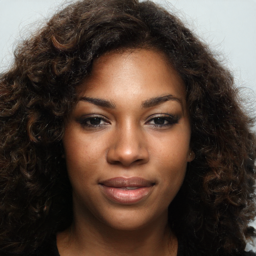

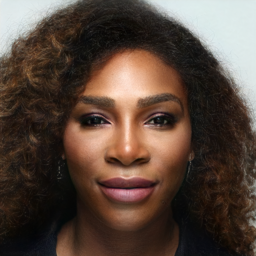

In [31]:
print('Upper image is the inversion before Pivotal Tuning and the lower image is the product of pivotal tuning')
plot_syn_images([old_image, new_image])

## InterfaceGAN edits

In [ ]:
latent_editor = LatentEditorWrapper()
latents_after_edit = latent_editor.get_single_interface_gan_edits(w_pivot, [-2, 2])

In order to get different edits. Such as younger face or make the face smile more. Please change the factors passed to "get_single_interface_gan_edits".
Currently the factors are [-2,2]. You can pass for example: range(-3,3)

In [ ]:
for direction, factor_and_edit in latents_after_edit.items():
  print(f'Showing {direction} change')
  for latent in factor_and_edit.values():
    old_image = old_G.synthesis(latent, noise_mode='const', force_fp32 = True)
    new_image = new_G.synthesis(latent, noise_mode='const', force_fp32 = True)
    plot_syn_images([old_image, new_image])

## StyleCLIP editing

### Download pretrained models

In [ ]:
mappers_base_dir = '/content/PTI/pretrained_models'

In [ ]:
# More pretrained mappers can be found at: "https://github.com/orpatashnik/StyleCLIP/blob/main/utils.py"
# Download Afro mapper
downloader.download_file("1i5vAqo4z0I-Yon3FNft_YZOq7ClWayQJ", os.path.join(mappers_base_dir, 'afro.pt'))

In [ ]:
# Download Mohawk mapper
downloader.download_file("1oMMPc8iQZ7dhyWavZ7VNWLwzf9aX4C09", os.path.join(mappers_base_dir, 'mohawk.pt'))

In [ ]:
# Download e4e encoder, used for the first inversion step instead on the W inversion.
downloader.download_file("1cUv_reLE6k3604or78EranS7XzuVMWeO", os.path.join(mappers_base_dir, 'e4e_ffhq_encode.pt'))

### Use PTI with e4e backbone for StyleCLIP

In [ ]:
# Changing first_inv_type to W+ makes the PTI use e4e encoder instead of W inversion in the first step
hyperparameters.first_inv_type = 'w+'
os.chdir('/content/PTI')
model_id = run_PTI(use_wandb=False, use_multi_id_training=use_multi_id_training)

### Apply edit

In [ ]:
from scripts.pti_styleclip import styleclip_edit

In [ ]:
paths_config.checkpoints_dir = '/content/PTI'
os.chdir('/content/PTI')
styleclip_edit(use_multi_id_G=use_multi_id_training, run_id=model_id, edit_types = ['afro'], use_wandb=False)
styleclip_edit(use_multi_id_G=use_multi_id_training, run_id=model_id, edit_types = ['mohawk'], use_wandb=False)

In [ ]:
original_styleCLIP_path = f'/content/PTI/StyleCLIP_results/{image_dir_name}/{image_name}/e4e/{image_name}_afro.jpg'
new_styleCLIP_path  = f'/content/PTI/StyleCLIP_results/{image_dir_name}/{image_name}/PTI/{image_name}_afro.jpg'
original_styleCLIP = Image.open(original_styleCLIP_path).resize((256,256))
new_styleCLIP =  Image.open(new_styleCLIP_path).resize((256,256))

In [ ]:
display_alongside_source_image([original_styleCLIP, new_styleCLIP])

In [ ]:
original_styleCLIP_path = f'/content/PTI/StyleCLIP_results/{image_dir_name}/{image_name}/e4e/{image_name}_mohawk.jpg'
new_styleCLIP_path  = f'/content/PTI/StyleCLIP_results/{image_dir_name}/{image_name}/PTI/{image_name}_mohawk.jpg'
original_styleCLIP = Image.open(original_styleCLIP_path).resize((256,256))
new_styleCLIP =  Image.open(new_styleCLIP_path).resize((256,256))

In [ ]:
display_alongside_source_image([original_styleCLIP, new_styleCLIP])

## Other methods comparison

### Invert image using other methods

In [ ]:
from scripts.latent_creators import e4e_latent_creator
from scripts.latent_creators import sg2_latent_creator
from scripts.latent_creators import sg2_plus_latent_creator

In [ ]:
e4e_latent_creator = e4e_latent_creator.E4ELatentCreator()
e4e_latent_creator.create_latents()
sg2_latent_creator = sg2_latent_creator.SG2LatentCreator(projection_steps = 600)
sg2_latent_creator.create_latents()
sg2_plus_latent_creator = sg2_plus_latent_creator.SG2PlusLatentCreator(projection_steps = 1200)
sg2_plus_latent_creator.create_latents()

In [ ]:
inversions = {}
sg2_embedding_dir = f'{w_path_dir}/{paths_config.sg2_results_keyword}/{image_name}'
inversions[paths_config.sg2_results_keyword] = torch.load(f'{sg2_embedding_dir}/0.pt')
e4e_embedding_dir = f'{w_path_dir}/{paths_config.e4e_results_keyword}/{image_name}'
inversions[paths_config.e4e_results_keyword] = torch.load(f'{e4e_embedding_dir}/0.pt')
sg2_plus_embedding_dir = f'{w_path_dir}/{paths_config.sg2_plus_results_keyword}/{image_name}'
inversions[paths_config.sg2_plus_results_keyword] = torch.load(f'{sg2_plus_embedding_dir}/0.pt')

In [ ]:
def get_image_from_w(w, G):
  if len(w.size()) <= 2:
      w = w.unsqueeze(0) 
  img = G.synthesis(w, noise_mode='const', force_fp32=True) 
  img = (img.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8).detach().cpu().numpy() 
  return img[0] 

In [ ]:
def plot_image_from_w(w, G): 
  img = get_image_from_w(w, G) 
  plt.axis('off') 
  resized_image = Image.fromarray(img,mode='RGB').resize((256,256)) 
  display(resized_image) 

In [ ]:
for inv_type, latent in inversions.items():
  print(f'Displaying {inv_type} inversion')
  plot_image_from_w(latent, old_G)
print(f'Displaying PTI inversion')
plot_image_from_w(w_pivot, new_G)